### World Class or Average at Best? 

### Can we determine if a Premier League Footballer is world class? By Zachary Wu

The English Premier League, often referred to as the Premier League or Prem, for short, is the top flight of English Football (soccer) and widely considered as the best league in the world. Comprised of 20 teams, the league is played every year from August to May where each team plays 38 long, gruesome matches (19 home and 19 away). Typically, 10 matches are played every weekend for about 38 weeks. A team will get 3 points for every win, 1 point for a draw, and 0 points for a loss. The team with the most points will be crowned as champions at the end of the season. 

A common point of debate among many fans and pundits worldwide is if a "X player is world class". There are countless debates and arguments surrounding this topic all over the internet everyday. In this project, I will attempt to use all of the data science technologies and tools I've learned to objectively determine to see if a player is/or will become a world class player in the future. 

### 1. Getting Our Data Set

Before we begin we need to import all of our needed packages. Pandas will primarily be used to access the data through a Dataframe. 

In [140]:
#Pandas and numpy for dataframe operations
import pandas as pd
import numpy as np

#Use IPython to display some cool gifs 
from IPython.display import Image

#For data visualization
import matplotlib.pyplot as plt

#Machine learning imports
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from joblib import dump
from joblib import load 

Obtaining our Data:

The very first step of any data science project is to actually get the data. I found a CSV file that contains the stats of every game of every player since 2016, which is a TON of data (there are almost 100,000 rows of data)! Note that this data was scraped from a Fantasy sports site so it contains more than enough statistics for us to go off of. For example, the dataset includes random facts such as the kickoff time of specific matches as well as home/away status of games! You can find the dataset from the user vaastav on Github if you want to access the data yourself: https://github.com/vaastav/Fantasy-Premier-League/tree/master/data.

In [141]:
#Read the CSV file into a pandas DataFrame
df = pd.read_csv('C:\\Users\\zacha\\CMSC320\\finalProj\\cleaned_merged_seasons.csv')

df

C:\Users\zacha\AppData\Local\Temp\ipykernel_99072\1836460092.py:2: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('C:\\Users\\zacha\\CMSC320\\finalProj\\cleaned_merged_seasons.csv')


,season_x,name,position,team_x,assists,bonus,bps,clean_sheets,creativity,element,...,team_h_score,threat,total_points,transfers_balance,transfers_in,transfers_out,value,was_home,yellow_cards,GW
0,2016-17,Aaron Cresswell,DEF,NaN,0,0,0,0,0.0,454,...,2.0,0.0,0,0,0,0,55,False,0,1
1,2016-17,Aaron Lennon,MID,NaN,0,0,6,0,0.3,142,...,1.0,0.0,1,0,0,0,60,True,0,1
2,2016-17,Aaron Ramsey,MID,NaN,0,0,5,0,4.9,16,...,3.0,23.0,2,0,0,0,80,True,0,1
3,2016-17,Abdoulaye Doucouré,MID,NaN,0,0,0,0,0.0,482,...,1.0,0.0,0,0,0,0,50,False,0,1
4,2016-17,Adam Forshaw,MID,NaN,0,0,3,0,1.3,286,...,1.0,0.0,1,0,0,0,45,True,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96164,2022-23,Oliver Skipp,MID,Spurs,0,0,16,0,0.0,441,...,1.0,0.0,2,100,742,642,43,False,0,38
96165,2022-23,Ryan Sessegnon,DEF,Spurs,0,0,0,0,0.0,436,...,1.0,0.0,0,-166,24,190,44,False,0,38
96166,2022-23,Ashley Young,DEF,Aston Villa,0,0,0,0,0.0,538,...,2.0,0.0,0,-1146,1522,2668,43,True,0,38
96167,2022-23,Jeremy Sarmiento Morante,MID,Brighton,0,0,0,0,0.0,119,...,2.0,0.0,0,-17,22,39,45,False,0,38


### 2. Cleaning

You can clearly see that the datasets above have too much data. Not only that, but the data seems to be way to messy. In order for us to be able to use the data, we need to clean it. I will be doing so by getting rid of unnessary columns, converting numerical values to numbers, etc. 

In [142]:
#delete useless columns
df = df.drop('bonus', axis=1)
df = df.drop('bps', axis=1)
df = df.drop('element', axis=1)
df = df.drop('fixture', axis=1)
df = df.drop('kickoff_time', axis=1)
df = df.drop('penalties_missed', axis=1)
df = df.drop('penalties_saved', axis=1)
df = df.drop('saves', axis=1)
df = df.drop('selected', axis=1)
df = df.drop('transfers_balance', axis=1)
df = df.drop('transfers_in', axis=1)
df = df.drop('transfers_out', axis=1)
df = df.drop('value', axis=1)

In [143]:
#Let's check the typing of our data as it stands
for col in df.columns:
    print(f"Type of {col}: {type(df[col][0])}")
    
#thankfully, it looks like the numerical data is already properly converted to ints and floats in numpy!

Type of season_x: <class 'str'>
Type of name: <class 'str'>
Type of position: <class 'str'>
Type of team_x: <class 'float'>
Type of assists: <class 'numpy.int64'>
Type of clean_sheets: <class 'numpy.int64'>
Type of creativity: <class 'numpy.float64'>
Type of goals_conceded: <class 'numpy.int64'>
Type of goals_scored: <class 'numpy.int64'>
Type of ict_index: <class 'numpy.float64'>
Type of influence: <class 'numpy.float64'>
Type of minutes: <class 'numpy.int64'>
Type of opponent_team: <class 'numpy.int64'>
Type of opp_team_name: <class 'str'>
Type of own_goals: <class 'numpy.int64'>
Type of red_cards: <class 'numpy.int64'>
Type of round: <class 'numpy.int64'>
Type of team_a_score: <class 'numpy.float64'>
Type of team_h_score: <class 'numpy.float64'>
Type of threat: <class 'numpy.float64'>
Type of total_points: <class 'numpy.int64'>
Type of was_home: <class 'numpy.bool_'>
Type of yellow_cards: <class 'numpy.int64'>
Type of GW: <class 'numpy.int64'>


The next big step will be to average out the player stats to get their all time career stats. Since our current dataframe contains data of every game of every player since 2016, we will need to average out the numerical stats and either transform or get rid of the categorical stats. After we do this, our dataset will be almost ready. 

In [144]:
#we can conviently use groupby name to combine stats for each player
numerical_stats = df.groupby('name').sum()

#calculate total games played per player and add as a new column
total_games = df.groupby('name').size()
numerical_stats['Total Games'] = total_games

#let's drop some of the categorical columns that will no longer be needed
numerical_stats = numerical_stats.drop('season_x', axis=1)
numerical_stats = numerical_stats.drop('team_x', axis=1)
numerical_stats = numerical_stats.drop('opp_team_name', axis=1)
numerical_stats

,position,assists,clean_sheets,creativity,goals_conceded,goals_scored,ict_index,influence,minutes,opponent_team,...,red_cards,round,team_a_score,team_h_score,threat,total_points,was_home,yellow_cards,GW,Total Games
name,,,,,,,,,,,,,,,,,,,,,
Aaron Connolly,FWDFWDFWDFWDFWDFWDFWDFWDFWDFWDFWDFWDFWDFWDFWDF...,1,1,87.2,18,2,51.3,106.6,937,826,...,0,1503,86.0,86.0,325.0,43,38,0,1503,76
Aaron Cresswell,DEFDEFDEFDEFDEFDEFDEFDEFDEFDEFDEFDEFDEFDEFDEFD...,25,39,2921.3,206,3,623.0,2653.8,13315,1906,...,1,3744,254.0,290.0,642.0,520,95,18,3744,190
Aaron Hickey,DEFDEFDEFDEFDEFDEFDEFDEFDEFDEFDEFDEFDEFDEFDEFD...,3,5,119.8,30,0,44.2,223.6,1918,412,...,0,765,41.0,63.0,98.0,63,19,7,765,38
Aaron Lennon,MIDMIDMIDMIDMIDMIDMIDMIDMIDMIDMIDMIDMIDMIDMIDM...,6,12,432.8,60,2,149.7,500.4,3956,1214,...,0,2281,116.0,172.0,569.0,147,56,4,2281,112
Aaron Mooy,MIDMIDMIDMIDMIDMIDMIDMIDMIDMIDMIDMIDMIDMIDMIDM...,3,10,848.8,52,4,195.2,753.2,3066,818,...,0,1484,77.0,95.0,350.0,113,38,4,1484,76
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zeze Steven Sessegnon,DEFDEFDEFDEFDEFDEFDEFDEFDEFDEFDEFDEFDEFDEFDEFD...,0,0,0.0,0,0,0.0,0.0,0,404,...,0,744,46.0,34.0,0.0,0,19,0,744,38
Zidane Iqbal,MIDMIDMIDMIDMIDMIDMIDMIDMIDMIDMIDMIDMIDMIDMIDM...,0,0,0.0,0,0,0.0,0.0,0,392,...,0,783,32.0,69.0,0.0,0,19,0,783,38
Álvaro Fernández,GKGKGKGKGKGKGKGKGKGKGKGKGKGKGKGKGKGKGKGKGKGKGK...,0,1,0.0,24,0,35.2,353.2,1080,434,...,0,925,49.0,67.0,0.0,31,20,0,925,42


Unfortunately, one of the categorical columns, Position, looks to be a bit weird since we sumed up a string which doesn't make sense. Since the Position column is important we can't just drop it. Instead we will encode the Position column. Since there are 4 positions, Goalkeeper (GK), Defender (DEF), Midfielder(MID), and Foward(FWD). We can assign a the abbreviation for each position rather than the weird looking string that was there before.

In [145]:
#iterate through each row in the DataFrame using iterrows()
for index, row in numerical_stats.iterrows():
    pos = row['position']
    if pos[0] == 'G':
        numerical_stats.at[index, 'position'] = "GK"
    elif pos[0] == 'D':
        numerical_stats.at[index, 'position'] = "DEF"
    elif pos[0] == 'M':
        numerical_stats.at[index, 'position'] = "MID"
    elif pos[0] == 'F':
        numerical_stats.at[index, 'position'] = "FWD"

#now, the 'Position' column has been updated based on the conditions described above
numerical_stats

,position,assists,clean_sheets,creativity,goals_conceded,goals_scored,ict_index,influence,minutes,opponent_team,...,red_cards,round,team_a_score,team_h_score,threat,total_points,was_home,yellow_cards,GW,Total Games
name,,,,,,,,,,,,,,,,,,,,,
Aaron Connolly,FWD,1,1,87.2,18,2,51.3,106.6,937,826,...,0,1503,86.0,86.0,325.0,43,38,0,1503,76
Aaron Cresswell,DEF,25,39,2921.3,206,3,623.0,2653.8,13315,1906,...,1,3744,254.0,290.0,642.0,520,95,18,3744,190
Aaron Hickey,DEF,3,5,119.8,30,0,44.2,223.6,1918,412,...,0,765,41.0,63.0,98.0,63,19,7,765,38
Aaron Lennon,MID,6,12,432.8,60,2,149.7,500.4,3956,1214,...,0,2281,116.0,172.0,569.0,147,56,4,2281,112
Aaron Mooy,MID,3,10,848.8,52,4,195.2,753.2,3066,818,...,0,1484,77.0,95.0,350.0,113,38,4,1484,76
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zeze Steven Sessegnon,DEF,0,0,0.0,0,0,0.0,0.0,0,404,...,0,744,46.0,34.0,0.0,0,19,0,744,38
Zidane Iqbal,MID,0,0,0.0,0,0,0.0,0.0,0,392,...,0,783,32.0,69.0,0.0,0,19,0,783,38
Álvaro Fernández,GK,0,1,0.0,24,0,35.2,353.2,1080,434,...,0,925,49.0,67.0,0.0,31,20,0,925,42


We see now that our dataset has approximately 1300 rows, which represents the number of players. This is significantly less than our original dataset which has almost 100,000 rows. I guess this implies that on average, each player plays ~100 games in their Premier League career during the time period from 2016-Present. 

This dataset of all of the current players is now ready for analysis. Our next step will be to obtain a dataset of so called "World Class" players and their stats. By doing this we will be able to compare our current players with these world class players to see which of our players has the potential of being world class. 

This seems easy enough, but finding a list of "World Class" players is difficult. I considered a few options:
1. Use the Premier League Hall of Fame as an indicator of the best players. The problem with this is that there are only about 20 players which would make for a small sample size.
2. Use a predetermined top 50 Premier League player list from a credible source. This could be the way to go.
3. Find the top 50 players based on a Fantasy sports metric such as total_points in my current dataset and use their stats as a benchmark. 

I ended up doing a combination of the 3 with more emphasis on options 1 and 2 (see below)

In [146]:
#luckily for us the points column basically represents how good a player has been in Fantasy terms which also translates to real world performance. 
#so we can sort by highest points tally and take say the top 25 players. 

#sort the DataFrame by the 'total_points' column in descending order
top_players = numerical_stats.sort_values(by='total_points', ascending=False)

#select the top 25 rows from the sorted DataFrame
top_players = top_players.head(25)

#lets rename numerical_stats
regular_players = numerical_stats

#now, 'top_players' contains the top 25 rows based on the 'total_points' column
top_players.head()

,position,assists,clean_sheets,creativity,goals_conceded,goals_scored,ict_index,influence,minutes,opponent_team,...,red_cards,round,team_a_score,team_h_score,threat,total_points,was_home,yellow_cards,GW,Total Games
name,,,,,,,,,,,,,,,,,,,,,
Harry Kane,FWD,43,66,3028.3,194,128,1787.9,6003.0,15317,1928,...,0,3787,259.0,318.0,8849.0,1138,95,20,3787,190
Mohamed Salah,MID,45,56,3512.2,137,96,1610.9,4802.2,12030,1592,...,0,3023,208.0,266.0,7800.0,1038,76,4,3023,152
Kevin De Bruyne,MID,77,65,7240.6,118,42,1584.6,4651.0,12554,1984,...,0,3779,283.0,336.0,3944.0,928,95,10,3779,190
Heung-Min Son,MID,38,55,3318.2,102,66,1158.1,3660.0,10483,1544,...,0,3033,201.0,243.0,4595.0,838,76,4,3033,152
Raheem Sterling,MID,51,54,3178.6,117,54,1222.9,3258.2,11634,1998,...,1,3782,269.0,308.0,5811.0,796,95,19,3782,190


We have just gotten the "best" 25 players based on their points accumulation. This list would look pretty accurate to any avid Premier League fan. 

Now lets add in the Premier League Hall of Famers to our top_players df. Unfortunately, I can't seem to find any compiled data of the 20 or so Hall of Fame players so it looks like I will have to manually input the data. It shouldn't be too bad! I will be using the hall of fame players from: https://www.premierleague.com/hall-of-fame/inductees. Their stats can easily be seen from: https://www.premierleague.com/stats/all-time.

In [147]:
#note that there is limited data for Hall of Famers since they were before the time of stats. So I will input Goals and Assists for MIDs/FWDS
#and cleansheets (a cleansheet is a game where a defender didn't concede a goal) for DEFs and GKs
top_players.loc['Peter Schmeichel'] = {'position': 'GK', 'clean_sheets': 128}
top_players.loc['Petr Cech'] = {'position': 'GK', 'clean_sheets': 202}

top_players.loc['Vincent Kompany'] = {'position': 'DEF', 'clean_sheets': 94}
top_players.loc['Rio Ferdinand'] = {'position': 'DEF', 'clean_sheets': 189}
top_players.loc['John Terry'] = {'position': 'DEF', 'clean_sheets': 214}
top_players.loc['Ashley Cole'] = {'position': 'DEF', 'clean_sheets': 147}

top_players.loc['Patrick Vieira'] = {'position': 'MID', 'goals_scored':31, 'assists':34}
top_players.loc['Paul Scholes'] = {'position': 'MID', 'goals_scored':107, 'assists':55}
top_players.loc['Roy Keane'] = {'position': 'MID', 'goals_scored':39, 'assists':33}
top_players.loc['David Beckham'] = {'position': 'MID', 'goals_scored':62, 'assists':80}
top_players.loc['Frank Lampard'] = {'position': 'MID', 'goals_scored':177, 'assists':102}
top_players.loc['Steven Gerrard'] = {'position': 'MID', 'goals_scored':120, 'assists':92}

top_players.loc['Ian Wright'] = {'position': 'FWD', 'goals_scored':113, 'assists':22}
top_players.loc['Didier Drogba'] = {'position': 'FWD', 'goals_scored':104, 'assists':55}
top_players.loc['Sergio Aguero'] = {'position': 'FWD', 'goals_scored':184, 'assists':47}
top_players.loc['Alan Shearer'] = {'position': 'FWD', 'goals_scored':260, 'assists':64}
top_players.loc['Eric Cantona'] = {'position': 'FWD', 'goals_scored':70, 'assists':56}
top_players.loc['Dennis Bergkamp'] = {'position': 'FWD', 'goals_scored':87, 'assists':94}
top_players.loc['Wayne Rooney'] = {'position': 'FWD', 'goals_scored':208, 'assists':103}
top_players.loc['Thierry Henry'] = {'position': 'FWD', 'goals_scored':175, 'assists':74}

top_players.head()

,position,assists,clean_sheets,creativity,goals_conceded,goals_scored,ict_index,influence,minutes,opponent_team,...,red_cards,round,team_a_score,team_h_score,threat,total_points,was_home,yellow_cards,GW,Total Games
name,,,,,,,,,,,,,,,,,,,,,
Harry Kane,FWD,43.0,66.0,3028.3,194.0,128.0,1787.9,6003.0,15317.0,1928.0,...,0.0,3787.0,259.0,318.0,8849.0,1138.0,95.0,20.0,3787.0,190.0
Mohamed Salah,MID,45.0,56.0,3512.2,137.0,96.0,1610.9,4802.2,12030.0,1592.0,...,0.0,3023.0,208.0,266.0,7800.0,1038.0,76.0,4.0,3023.0,152.0
Kevin De Bruyne,MID,77.0,65.0,7240.6,118.0,42.0,1584.6,4651.0,12554.0,1984.0,...,0.0,3779.0,283.0,336.0,3944.0,928.0,95.0,10.0,3779.0,190.0
Heung-Min Son,MID,38.0,55.0,3318.2,102.0,66.0,1158.1,3660.0,10483.0,1544.0,...,0.0,3033.0,201.0,243.0,4595.0,838.0,76.0,4.0,3033.0,152.0
Raheem Sterling,MID,51.0,54.0,3178.6,117.0,54.0,1222.9,3258.2,11634.0,1998.0,...,1.0,3782.0,269.0,308.0,5811.0,796.0,95.0,19.0,3782.0,190.0


Now that we have our updated df of top players we can start to wrap up our data wrangling section of the project. Note that our top_players df contains 45 players and largely consist of the 45 best players that the Premier League has ever seen. To verify this, we can look up a top 50 player list from the website GiveMeSport: https://www.givemesport.com/greatest-premier-league-players-of-all-time/. Looking at this list, there are many, many overlaps with our curated top_players df. Thus we have our list of "world class players"!!!

### 3. Data Visualization and Exploratory Data Analysis

a) In the following section, we will try to get a sense of our two dataframes, regular_players and top_players to see what it truly takes to be considered "world class" by footballing metrics. We will make comparisons based on player position (it won't be fair and it will just be silly to compare Goalkeepers vs Fowards based on goals scored).

Text(0, 0.5, 'CS')

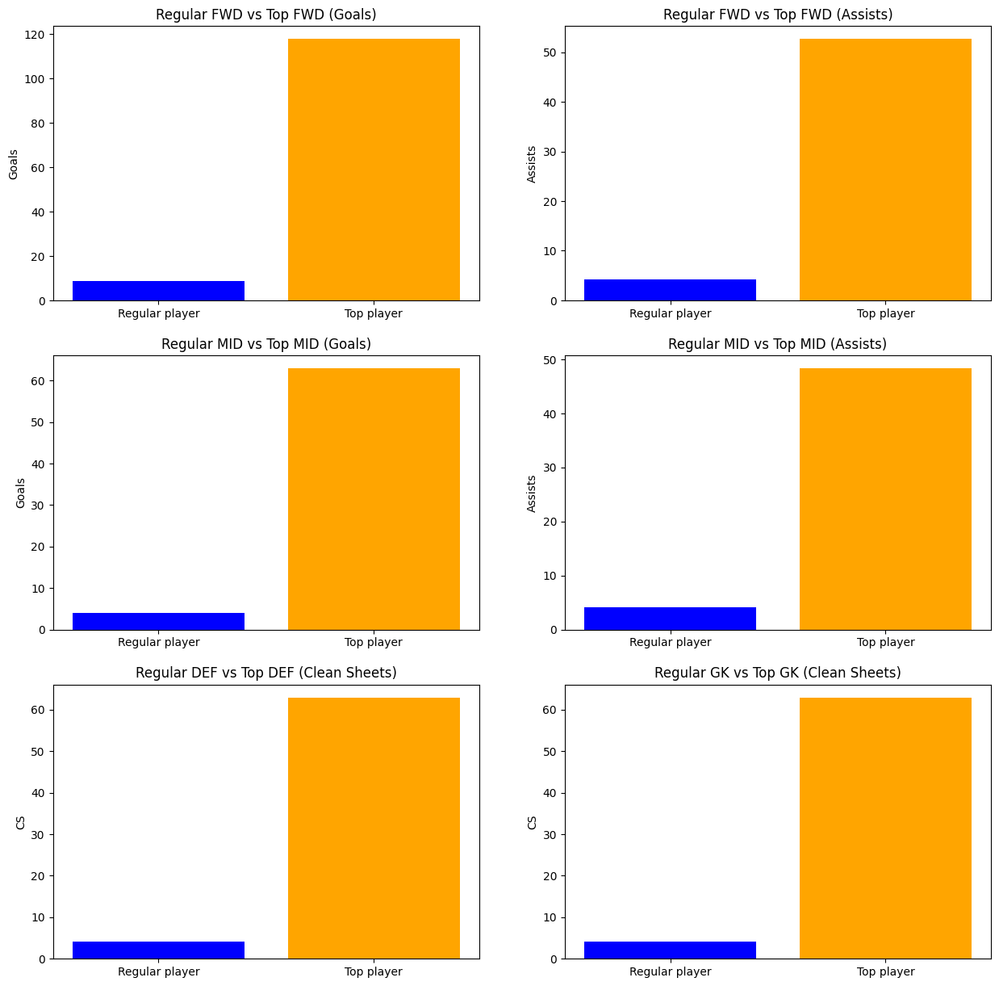

In [148]:
#FWDs
#average out both goal tallies
regular_fwd_goals = regular_players[regular_players['position'] == 'FWD']['goals_scored'].mean()
top_fwd_goals = top_players[top_players['position'] == 'FWD']['goals_scored'].mean()
goals = [regular_fwd_goals, top_fwd_goals]

#creating a 3x2 grid of subplots
fig, axs = plt.subplots(3, 2, figsize=(15, 15))

#plotting the first set of bars in the first subplot
axs[0, 0].bar(['Regular player', 'Top player'], goals, color=['blue', 'orange'])
axs[0, 0].set_title('Regular FWD vs Top FWD (Goals)')
axs[0, 0].set_ylabel('Goals')

#average out both assist tallies
regular_fwd_as = regular_players[regular_players['position'] == 'FWD']['assists'].mean()
top_fwd_as = top_players[top_players['position'] == 'FWD']['assists'].mean()
assists = [regular_fwd_as, top_fwd_as]

#plotting the second set of bars in the second subplot
axs[0, 1].bar(['Regular player', 'Top player'], assists, color=['blue', 'orange'])
axs[0, 1].set_title('Regular FWD vs Top FWD (Assists)')
axs[0, 1].set_ylabel('Assists')

#MIDs
#average out both goal tallies
regular_mid_goals = regular_players[regular_players['position'] == 'MID']['goals_scored'].mean()
top_mid_goals = top_players[top_players['position'] == 'MID']['goals_scored'].mean()
goals = [regular_mid_goals, top_mid_goals]

#plotting the first set of bars in the first subplot
axs[1, 0].bar(['Regular player', 'Top player'], goals, color=['blue', 'orange'])
axs[1, 0].set_title('Regular MID vs Top MID (Goals)')
axs[1, 0].set_ylabel('Goals')

#average out both assist tallies
regular_mid_as = regular_players[regular_players['position'] == 'MID']['assists'].mean()
top_mid_as = top_players[top_players['position'] == 'MID']['assists'].mean()
assists = [regular_mid_as, top_mid_as]

#plotting the second set of bars in the second subplot
axs[1, 1].bar(['Regular player', 'Top player'], assists, color=['blue', 'orange'])
axs[1, 1].set_title('Regular MID vs Top MID (Assists)')
axs[1, 1].set_ylabel('Assists')

#DEF
#average out clean sheet tallies
regular_def_cs = regular_players[regular_players['position'] == 'DEF']['clean_sheets'].mean()
top_def_cs = top_players[top_players['position'] == 'DEF']['clean_sheets'].mean()
cs = [regular_def_cs, top_def_cs]

#plotting the first set of bars in the first subplot
axs[2, 0].bar(['Regular player', 'Top player'], goals, color=['blue', 'orange'])
axs[2, 0].set_title('Regular DEF vs Top DEF (Clean Sheets)')
axs[2, 0].set_ylabel('CS')

#GKs
#average out clean sheet tallies
regular_gk_cs = regular_players[regular_players['position'] == 'GK']['clean_sheets'].mean()
top_gk_cs = top_players[top_players['position'] == 'GK']['clean_sheets'].mean()
cs = [regular_gk_cs, top_gk_cs]

#plotting the first set of bars in the second subplot
axs[2, 1].bar(['Regular player', 'Top player'], goals, color=['blue', 'orange'])
axs[2, 1].set_title('Regular GK vs Top GK (Clean Sheets)')
axs[2, 1].set_ylabel('CS')

As we can see, the difference between a regular player and a top player is pretty drastic, with the best players outperforming the regular players in every category and in every position. This goes to show the great lengths that one must go to in order to be considered in the world class bracket. It is important to note that we used the average for all the quantities graphed so some individual players may have reached world class status. 

b) The difference between a top player and regular player is huge as we have just seen. But surely the gap between the 2 categories isn't as drastic as it seems right? Let's find out. In this next section we will be comparing the stats of an average top player with the "best" regular player to see how they differ.

best regular player:  Callum Wilson
Position:  FWD


Text(0, 0.5, 'Assists')

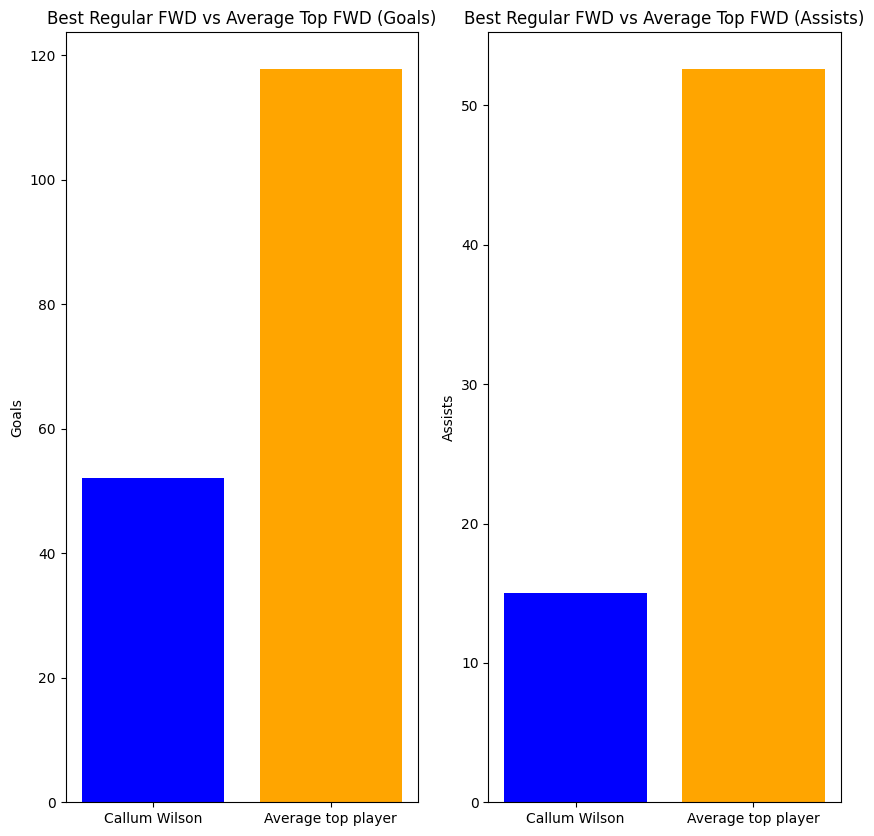

In [149]:
#sort based on points as we did before
sorted_regular_players = regular_players.sort_values(by='total_points', ascending=False)

#print the 26th ranked player since in our top_players dataset we took the players ranked from 1-25
print("best regular player: ", sorted_regular_players.iloc[25].name)
print("Position: ", sorted_regular_players.iloc[25]['position'])

goals = [sorted_regular_players.iloc[25]['goals_scored'], top_players[top_players['position'] == 'FWD']['goals_scored'].mean()]

#creating a 3x2 grid of subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 10))

#plotting the first set of bars in the first subplot
axs[0].bar(['Callum Wilson', 'Average top player'], goals, color=['blue', 'orange'])
axs[0].set_title('Best Regular FWD vs Average Top FWD (Goals)')
axs[0].set_ylabel('Goals')

assists = [sorted_regular_players.iloc[25]['assists'], top_players[top_players['position'] == 'FWD']['assists'].mean()]

#plotting the second set of bars in the second subplot
axs[1].bar(['Callum Wilson', 'Average top player'], assists, color=['blue', 'orange'])
axs[1].set_title('Best Regular FWD vs Average Top FWD (Assists)')
axs[1].set_ylabel('Assists')

Ah, we can see that there is some more balance between the 2 groups. This makes intuitive sense though, as Callum Wilson isn't that far off from being considered a top player. There are also some extreme outliers in the top_players dataset with a ridiculous amount of goals and assists (Like Alan Shearer, who holds the record with 260 Premier League Goals!!). 

c) How can a player become World Class? 

Next we will look at some trends to see a player's progression through the years to see if they can reach world class status. Let's see if a statistic like say, goals_scored over time can help us see if a Foward (FWD) player will reach elite heights in the future. To do this let's consider a single player for now. We can just look at Callum Wilson as in the earlier section. 

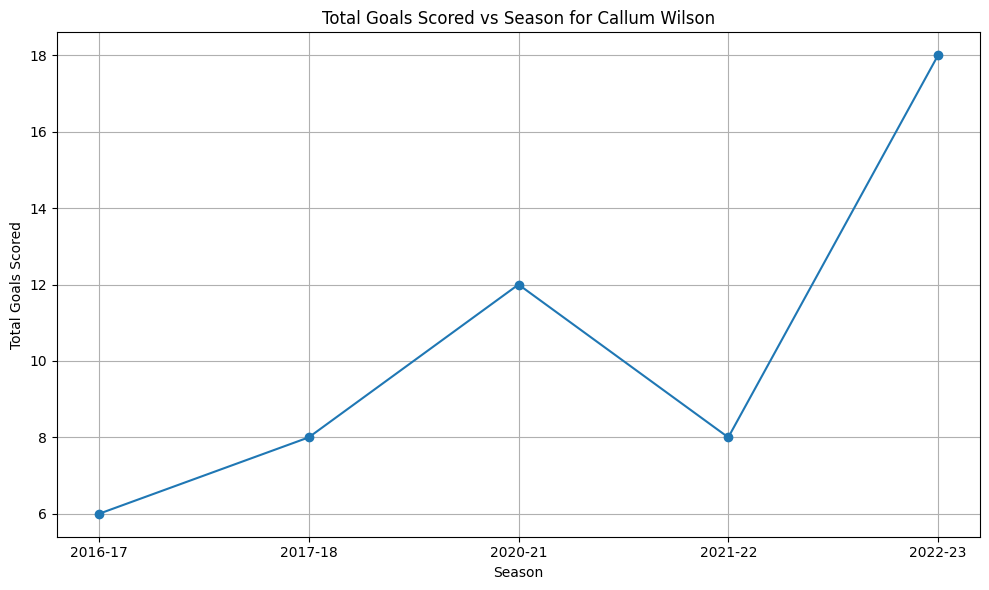

In [150]:
def plot_goals(player_name):
    #filter the DataFrame for the specific player
    player_df = df[df['name'] == player_name]

    goals_by_season = player_df.groupby('season_x')['goals_scored'].sum()

    #plotting 
    plt.figure(figsize=(10, 6)) 
    plt.plot(goals_by_season.index, goals_by_season.values, marker='o', linestyle='-')
    plt.title(f'Total Goals Scored vs Season for {player_name}')
    plt.xlabel('Season')
    plt.ylabel('Total Goals Scored')
    plt.grid(True)
    plt.xticks(goals_by_season.index)  
    plt.tight_layout()
    plt.show()
    
plot_goals('Callum Wilson')

Cool! Now let's compare these tallies with that of an elite player, say Harry Kane.

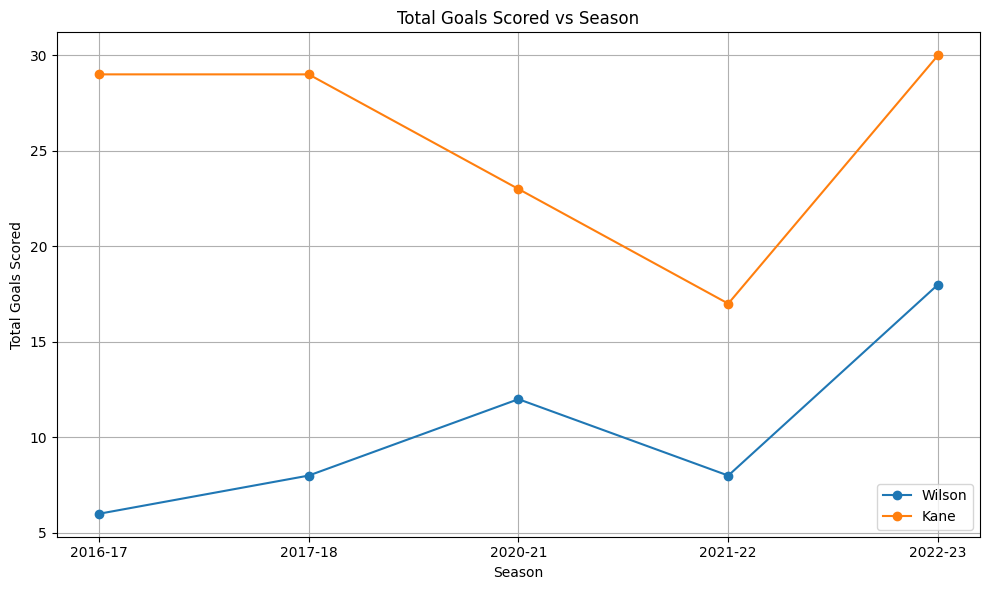

In [151]:
#filter the DataFrame for the specific players
player1_df = df[df['name'] == 'Callum Wilson']
player2_df = df[df['name'] == 'Harry Kane']

goals_by_season_player1 = player1_df.groupby('season_x')['goals_scored'].sum()
goals_by_season_player2 = player2_df.groupby('season_x')['goals_scored'].sum()

#plotting the line graph for both players on the same plot
plt.figure(figsize=(10, 6))  
plt.plot(goals_by_season_player1.index, goals_by_season_player1.values, marker='o', linestyle='-', label='Wilson')
plt.plot(goals_by_season_player2.index, goals_by_season_player2.values, marker='o', linestyle='-', label='Kane')
plt.title('Total Goals Scored vs Season')
plt.xlabel('Season')
plt.ylabel('Total Goals Scored')
plt.grid(True)
plt.xticks(goals_by_season_player1.index)  
plt.legend() 
plt.tight_layout()
plt.show()

From here we can see the differences between one of the best average players, compared to an elite player in Harry Kane. Kane's worst season is still comparable to Wilson's best season! 

d) Is it harder/easier for a forward to become an elite player now compared to back then?

Many people claim that the league has become easier to score nowadays with worse defensive teams. Some say that teams just sit back nowadays and don't play freeflowing football. Let's see if this is actually true. We can use the clean_sheets metric in our original dataset to see how defensive stats have evolved over the past few years. As a reminder, a clean sheet is jargon in football/soccer for not conceding any goals in a game!

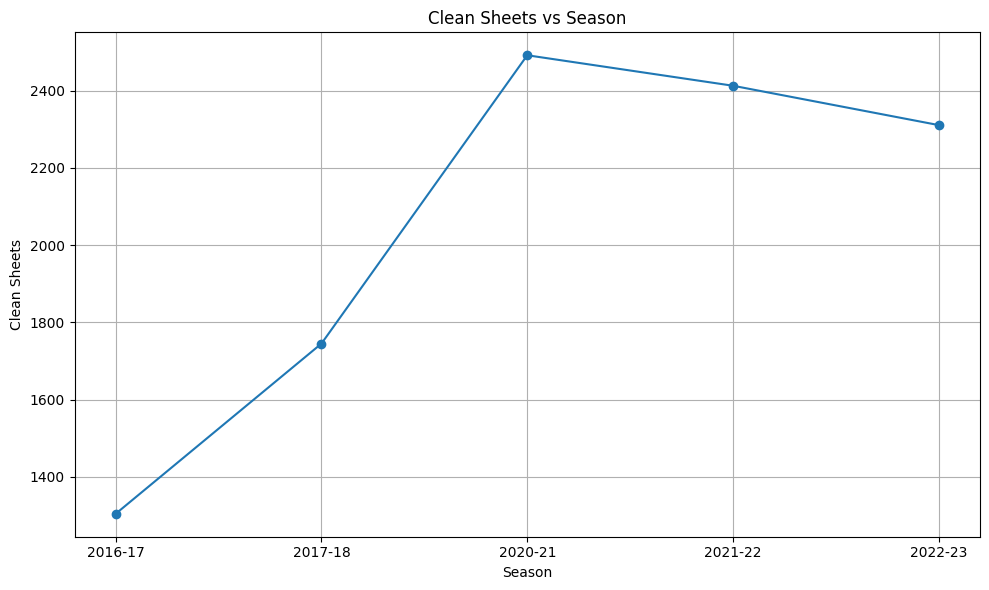

In [152]:
clean_sheets_by_season = df.groupby('season_x')['clean_sheets'].sum()

#plotting the line graph
plt.figure(figsize=(10, 6))  
plt.plot(clean_sheets_by_season.index, clean_sheets_by_season.values, marker='o', linestyle='-')
plt.title('Clean Sheets vs Season')
plt.xlabel('Season')
plt.ylabel('Clean Sheets')
plt.grid(True)
plt.xticks(clean_sheets_by_season.index) 
plt.tight_layout()
plt.show()

Hmm, this is actually really interesting. It shows that teams are becoming more defensive as years progress. Specifically, we see a spike in clean sheets in the 20-21 season. This was also known as the lockdown 'covid' season, so it might contribute to why there were more clean sheets during this time. 

### 4. Machine Learning!!

Now that we've seen some cool looking graphs of our data and know what we are working with, we can get to the interesting part, machine learning! I will show how we can use train and use 2 different classification algorithms to predict if a player will reach world class levels. We will then apply these algorithms to our regular_players dataset to make some predictions!

Let's first start with K Nearest Neighbors (KNN)

In [153]:
sorted_regular_players = regular_players.sort_values(by='total_points', ascending=False)

#Create a new column 'elite' and label top 50 players as 'elite'
sorted_regular_players['elite'] = 'Not Elite'  # Initialize with 'Not Elite'
sorted_regular_players.loc[sorted_regular_players.index[:50], 'elite'] = 'Elite'

#We need to convert our position column into numerical data for it to be used in KNN
position_map = {'GK': 0, 'DEF': 1, 'MID': 2, 'FWD': 3}

#Create a new column to store the encoded values
sorted_regular_players['position_encoded'] = 0
for idx, row in sorted_regular_players.iterrows():
    position = row['position']
    if position in position_map:
        sorted_regular_players.at[idx, 'position_encoded'] = position_map[position]

#get rid of the old position column
sorted_regular_players['position'] = sorted_regular_players['position_encoded']
sorted_regular_players.drop(columns=['position_encoded'], inplace=True)

X = sorted_regular_players.drop(columns=['elite'])  # Features
y = sorted_regular_players['elite']  # Labels

sorted_regular_players

,position,assists,clean_sheets,creativity,goals_conceded,goals_scored,ict_index,influence,minutes,opponent_team,...,round,team_a_score,team_h_score,threat,total_points,was_home,yellow_cards,GW,Total Games,elite
name,,,,,,,,,,,,,,,,,,,,,
Harry Kane,3,43,66,3028.3,194,128,1787.9,6003.0,15317,1928,...,3787,259.0,318.0,8849.0,1138,95,20,3787,190,Elite
Mohamed Salah,2,45,56,3512.2,137,96,1610.9,4802.2,12030,1592,...,3023,208.0,266.0,7800.0,1038,76,4,3023,152,Elite
Kevin De Bruyne,2,77,65,7240.6,118,42,1584.6,4651.0,12554,1984,...,3779,283.0,336.0,3944.0,928,95,10,3779,190,Elite
Heung-Min Son,2,38,55,3318.2,102,66,1158.1,3660.0,10483,1544,...,3033,201.0,243.0,4595.0,838,76,4,3033,152,Elite
Raheem Sterling,2,51,54,3178.6,117,54,1222.9,3258.2,11634,1998,...,3782,269.0,308.0,5811.0,796,95,19,3782,190,Elite
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Liam Gibbs,2,0,0,0.0,0,0,0.0,0.0,0,213,...,565,32.0,25.0,0.0,0,9,0,565,19,Not Elite
Ørjan Nyland,0,0,0,0.0,0,0,0.0,0.0,0,416,...,791,53.0,48.0,0.0,0,19,0,791,38,Not Elite
Nohan Kenneh,2,0,0,0.0,0,0,0.0,0.0,0,363,...,749,54.0,52.0,0.0,-1,17,1,749,34,Not Elite


In [154]:
#Split dataset into training and testing datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#Train the KNN classifier
knn = KNeighborsClassifier(n_neighbors=5) 
knn.fit(X_train_scaled, y_train)

#Predict on the testing set
y_pred = knn.predict(X_test_scaled)

#Evaluate
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.9736842105263158


Great! We now have our KNN model. Lets use this to see which current day Premier League players are (or will become) elite.

In [155]:
#Lets convert to regular_players to numerical data like we did before.
position_map = {'GK': 0, 'DEF': 1, 'MID': 2, 'FWD': 3}

#Create a new column to store the encoded values
regular_players['position_encoded'] = 0
for idx, row in regular_players.iterrows():
    position = row['position']
    if position in position_map:
        regular_players.at[idx, 'position_encoded'] = position_map[position]

#get rid of the old position column
regular_players['position'] = regular_players['position_encoded']
regular_players.drop(columns=['position_encoded'], inplace=True)

                           elite
name                            
Andrew Robertson           Elite
Ben Mee                    Elite
Christian Eriksen          Elite
Craig Dawson               Elite
César Azpilicueta          Elite
David de Gea               Elite
Ederson Santana de Moraes  Elite
Gabriel Fernando de Jesus  Elite
Harry Kane                 Elite
Heung-Min Son              Elite
Hugo Lloris                Elite
Ilkay Gündogan             Elite
James Ward-Prowse          Elite
Jamie Vardy                Elite
Jordan Pickford            Elite
Kasper Schmeichel          Elite
Kevin De Bruyne            Elite
Kyle Walker                Elite
Lewis Dunk                 Elite
Lukasz Fabianski           Elite
Marcus Rashford            Elite
Michael Keane              Elite
Michail Antonio            Elite
Mohamed Salah              Elite
Nick Pope                  Elite
Pascal Groß                Elite
Raheem Sterling            Elite
Riyad Mahrez               Elite
Roberto Fi

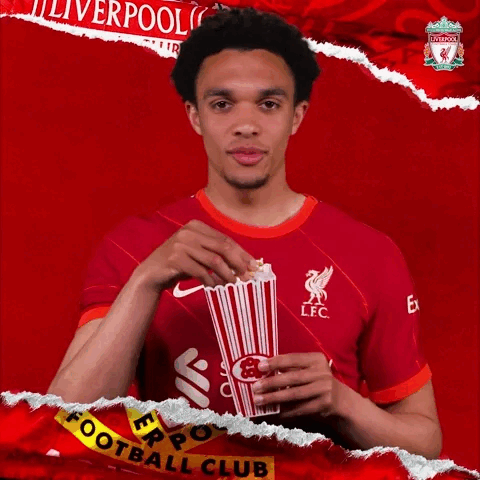

In [156]:
X_regular = regular_players  

X_regular_scaled = scaler.transform(X_regular)

#Predict elite status using the trained KNN classifier
elite_status = knn.predict(X_regular_scaled)

#Create a DataFrame to store the results
elite_df = pd.DataFrame(elite_status, index=regular_players.index, columns=['elite'])

#Now we can see which players are considered elite
non_elites = elite_df[elite_df['elite'] == 'Not Elite']
the_elites = elite_df[elite_df['elite'] == 'Elite']

print(the_elites)
Image(filename='trent.gif')

We finally got our results! We can see that the elite, or so called world class players are alot of the names that we would expect. Some of the best players in the world like Trent Alexander-Arnold, Pascal Groß, and Craig Dawson are on our list. It will be interesting to see how this list develops as more and more data is obtained. At the time of creating this project, there is about 7ish seasons of stats, but we will be able to obtain much more in the the near future. 

It is also very important to note that the data gathered was from Fantasy Premier League, which as the name implies is a Fantasy sports game for the English Premier League. Because of this, the many of the stats in our initial dataset are stats pertaining to the realm of Fantasy sports. In the real world, judging a player as world class or not should be used with more comprehensive stats, not just the ones obtained from Fantasy Premier League. However, the Fantasy stats are derived from real world, in-game stats so they are good enough to give us a groundwork to make predictions. 

Also, it is important to note that the data takes account of career long data. So a beast like Erling Haaland, who broke the record for most goals in a single season with 36 his debut season, is not our list because his Premier League career has just started. 

Next let's take a look at another algorithm. This time we will use Logistic Regression to make binary classifications.

In [157]:
#our sorted_regular_players df is already labeled with a column classifying elite/not elite
sorted_regular_players = sorted_regular_players.sort_index()

X = sorted_regular_players.drop('elite', axis=1)  # Features
y = sorted_regular_players['elite']  # Target variable

#Splitting data into training and testing datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#Training the logistic regression model
model = LogisticRegression()
model.fit(X_train, y_train)

#Make predictions on testing set
y_pred = model.predict(X_test)

#Evaluate like before
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

dump(model, 'logistic_regression_model.joblib')

Accuracy: 0.943609022556391


c:\Users\zacha\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


['logistic_regression_model.joblib']

We have our trained model now. As before with KNN, let us now see which players our logistic regression model will classify as elite. We'll use the same dataset that we used for KNN.

In [158]:
#Load the trained model with load(we imported this)
model = load('logistic_regression_model.joblib')

#Make predicitons
predictions = model.predict(regular_players)

regular_players['elite'] = predictions

Alexandre Lacazette
Alisson Ramses Becker
Andrew Robertson
Antonio Rüdiger
Ben White
Benjamin White
Bernardo Mota Veiga de Carvalho e Silva
Bruno Borges Fernandes
Bruno Miguel Borges Fernandes
Bryan Mbeumo
Bukayo Saka
Christian Eriksen
César Azpilicueta
David De Gea Quintana
David Raya Martin
David de Gea
Diogo Jota
Ederson Santana de Moraes
Emiliano Martínez
Emiliano Martínez Romero
Erling Haaland
Ethan Pinnock
Gabriel Magalhães
Gabriel Martinelli Silva
Gabriel dos Santos Magalhães
Gary Cahill
Georginio Wijnaldum
Granit Xhaka
Harry Kane
Heung-Min Son
Hugo Lloris
Illan Meslier
Ivan Toney
Jack Grealish
James Maddison
Jamie Vardy
Jordan Pickford
José Malheiro de Sá
João Pedro Cavaco Cancelo
Kevin De Bruyne
Leandro Trossard
Lukasz Fabianski
Mason Mount
Miguel Almirón Rejala
Mohamed Salah
Ollie Watkins
Pascal Groß
Raheem Sterling
Riyad Mahrez
Roberto Firmino
Rodrigo Hernandez
Romelu Lukaku
Rúben Santos Gato Alves Dias
Sadio Mané
Sergio Agüero
Solly March
Son Heung-min
Sven Botman
Tomas Sou

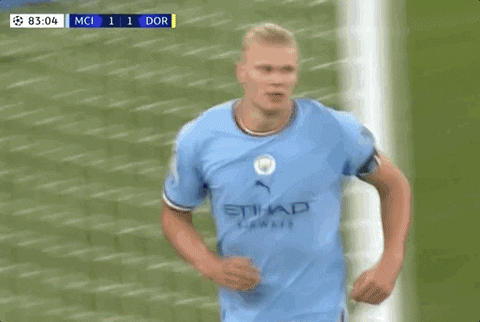

In [159]:
#let's get the names of players that our logistic regression model thinks is elite (world class)
elites = regular_players[regular_players['elite'] == 'Elite']
names = elites.index.tolist()
for name in names:
    print(name)
Image(filename='haaland.gif')

We see that our logistic regression model picked WAY more players as elite players compared to the KNN model. We see the inclusion of many players outside the "Big 6" clubs (Manchester City, Manchester United, Chelsea, Liverpool, Arsenal, and Tottenham). Additionally, it looks like the logistic regression model didn't just pick players based on their career stats. We saw that a big flaw of the KNN classifer was that it left out some of the best players in the world like Erling Haaland simply because he had only played one year in the Premier League. However, the logistic regression model picked Haaland! It also picked many more new additions to the Premier League such as Sven Botman (Newcastle) and Ivan Toney (Brentford). This makes way more intuitive sense so that is huge for our project. 

Because of this, it seems like the logistic regression model is more accurate than than KNN model when judging the elite status of Premier League players. It will be very interesting to see how these models react when players such as Haaland play more seasons in the Premier League. 

### 5. Final Remarks

After performing 2 classification algorithms we see what it takes to be considered as an elite or world class player. Even if a player with longevity is performing at the top level for many years, there is no guarantee that he will be considered world class. To be world class you must be the best in the Premier League. On the other hand some players who have a ridiculous break out season like Erling Haaland can automatically be classified as world class. It was very interesting to see how the model reacted to different types of players, but overall, it looked like the models chose a good variety of players from different positions. It will be interesting to see how the model reacts in a few years when we get more and more data on our hands.

I hope you enjoyed reading through my tutorial as much as I enjoyed making it! Let's watch some ball!
